## Knight Frank assessment for ESG Data Analyst
Exploratory Data Analysis for Leeds building ESG variables and price property transect

In [1]:
##########################################
#Knight Frank ESG Data Analyst Assessment#
#Maintainer: Christopher Chan            #
#Date: 2024-12-20                        #
#Version: 0.0.4                          #
##########################################

# Data ingestion

import os, sys, re
import folium

import numpy as np
import pandas as pd
import geopandas as gpd
import seaborn as sns
import contextily as cx
import matplotlib.pyplot as plt
import osmnx as ox
import pyarrow as pa

from pathlib import Path

%matplotlib inline

# Data Paths
data_raw = Path("../data/01_raw")
data_intermediate = Path("../data/02_intermediate")

# Figure Paths
if os.path.exists("../docs/figures"):
    print("Figure dir exist")
    figure_path = Path("../docs/figures")
else:
    os.makedirs("../docs/figures")
    figure_path = Path("../docs/figures")

if os.path.exists(f"{data_intermediate}/property_data.parquet"):
    print("Cleaned parquet file exist, reading from 02_intermediate")
    prop_df = pd.read_parquet(f"{data_intermediate}/property_data.parquet", engine="pyarrow", dtype_backend="pyarrow")

else:
    with open(f"{data_raw}/Property Data -- data science test.csv", "r") as df:
        prop_df = pd.read_csv(df, index_col = 0, engine = "pyarrow")
        # Solve duplicates with left merge with last and first
        prop_df_dup = prop_df[prop_df.duplicated(subset = "LRUniqueID", keep = "last")]
        prop_df.drop_duplicates(subset = "LRUniqueID", keep = "first", inplace = True)
        prop_df = pd.merge(prop_df, prop_df_dup, how = "left", sort = True)
        assert not prop_df.duplicated().any(), "Duplicate rows found in DataFrame"
        
    # Data Dtype Cleaning
    propdf_dtype = {
        # Datetime
        "SaleDate": lambda x: pd.to_datetime(x, format='%d/%m/%Y').dt.strftime('%Y-%m-%d'),
        "INSPECTION_DATE": lambda x: pd.to_datetime(x, format='%d/%m/%Y').dt.strftime('%Y-%m-%d'),
        # Boolean
        "NewBuild": lambda x: x.replace({'Y': True, 'N': False, ' ': None}),
        "MAINS_GAS_FLAG": lambda x: x.replace({'Y': True, 'N': False, ' ': None}),
        # Numeric
        "SalePrice": lambda x: pd.to_numeric(x, errors='coerce'),
        "UDPRNKey": lambda x: pd.to_numeric(x, errors='coerce'),
        "TOTAL_FLOOR_AREA": lambda x: pd.to_numeric(x, errors='coerce'),
        "NUMBER_HABITABLE_ROOMS": lambda x: pd.to_numeric(x, errors='coerce'),
        "EXTENSION_COUNT": lambda x: pd.to_numeric(x, errors='coerce'),
        "CURRENT_ENERGY_EFFICIENCY": lambda x: pd.to_numeric(x, errors='coerce'),
        "ENERGY_CONSUMPTION_POTENTIAL": lambda x: pd.to_numeric(x, errors='coerce'),
        "POTENTIAL_ENERGY_EFFICIENCY": lambda x: pd.to_numeric(x, errors='coerce'),
        "ENERGY_CONSUMPTION_CURRENT": lambda x: pd.to_numeric(x, errors='coerce'),
        "ENERGY_CONSUMPTION_POTENTIAL": lambda x: pd.to_numeric(x, errors='coerce'),
        "Latitude": lambda x: pd.to_numeric(x, errors='coerce'),
        "Longitude": lambda x: pd.to_numeric(x, errors='coerce')
    }
    
    for col, dtype in propdf_dtype.items():
        if callable(dtype):
            prop_df[col] = dtype(prop_df[col])
            
    # Then convert all other columns to string
    other_cols = [col for col in prop_df.columns if col not in propdf_dtype]
    prop_df[other_cols] = prop_df[other_cols].astype("string")
    
    print(prop_df.info())

    # Longitude and Latitude for prop dataset is flipped
    prop_df.rename(columns={
        'Latitude': 'Longitude',
        'Longitude': 'Latitude'
        }, inplace=True)

    
    print("Creating parquet file from csv, writing parquet to 02_intermediate")
    prop_df.to_parquet(f"{data_intermediate}/property_data.parquet", engine="pyarrow")

    with open(f"{data_intermediate}/property_data.parquet", "rb") as pqt:
        prop_df = pd.read_parquet(pqt, engine="pyarrow", dtype_backend="pyarrow")

# Read prop df as geodataframe and save as geojson
# Projection: EPSG:4326

if os.path.exists(f"{data_intermediate}/property.geojson"):
    print("File exist, reading from 02_intermediate")
    with open(f"{data_intermediate}/property.geojson", "r") as gdf:
        prop_gdf = gpd.read_file(gdf)

else:
    print("Creating gdf from pandas, writing geojson to 02_intermediate")
    prop_gdf = gpd.GeoDataFrame(prop_df, geometry=gpd.points_from_xy(prop_df["Longitude"], prop_df["Latitude"]), crs="EPSG:4326")
    prop_gdf.to_file(f"{data_intermediate}/property.geojson", driver="GeoJSON")

# Read rail df as geodataframe and save as geojson
# Project: EPSG:4326

with open(f"{data_raw}/UK train and metro stations.csv", "r") as df:
    rail_df = pd.read_csv(df)
    # Convert object to string
    rail_df["Station"] = rail_df["Station"].astype("string")
    rail_df_dup = rail_df[rail_df.duplicated(subset = "Station", keep = "last")]
    rail_df.drop_duplicates(subset = "Station", keep = "first", inplace = True)
    rail_df = pd.merge(rail_df, rail_df_dup, how = "left", sort = True)
    assert not rail_df.duplicated().any(), "Duplicate rows found in DataFrame"
    
if os.path.exists(f"{data_intermediate}/train_metro.geojson"):
    print("File exist, reading from 02_intermediate")
    with open(f"{data_intermediate}/train_metro.geojson") as gdf:
        rail_gdf = gpd.read_file(gdf)

else:
    print("Creating gdf from pandas, writing geojson to 02_intermediate")
    rail_gdf = gpd.GeoDataFrame(rail_df, geometry=gpd.points_from_xy(rail_df["lng"], rail_df["lat"]), crs="EPSG:4326")
    rail_gdf.to_file(f"{data_intermediate}/train_metro.geojson", driver="GeoJSON")

Figure dir exist


/var/folders/tz/q11qj2t518z2mqsm9xzdw7r00000gn/T/ipykernel_2999/1917580532.py:57: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  "NewBuild": lambda x: x.replace({'Y': True, 'N': False, ' ': None}),


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 151285 entries, 0 to 151284
Data columns (total 31 columns):
 #   Column                        Non-Null Count   Dtype  
---  ------                        --------------   -----  
 0   LRUniqueID                    151285 non-null  string 
 1   SalePrice                     151285 non-null  int64  
 2   SaleDate                      151285 non-null  object 
 3   PCUnit                        151285 non-null  string 
 4   PropertyType                  151285 non-null  string 
 5   NewBuild                      151285 non-null  bool   
 6   Tenure                        151285 non-null  string 
 7   Add1                          151285 non-null  string 
 8   Add2                          151285 non-null  string 
 9   Add3                          151285 non-null  string 
 10  Add4                          151285 non-null  string 
 11  Add5                          151285 non-null  string 
 12  Add6                          151285 non-nul

In [2]:
prop_df

,LRUniqueID,SalePrice,SaleDate,PCUnit,PropertyType,NewBuild,Tenure,Add1,Add2,Add3,...,CURRENT_ENERGY_EFFICIENCY,POTENTIAL_ENERGY_EFFICIENCY,ENERGY_CONSUMPTION_CURRENT,ENERGY_CONSUMPTION_POTENTIAL,MAINS_GAS_FLAG,BUILT_FORM,CONSTRUCTION_AGE_BAND,LMK_KEY,Longitude,Latitude
0,{0001B56C-8D8B-48A9-992E-2C511C619F98},113500,2005-01-27,LS28 5TX,Terraced,False,Freehold,5,,NEW PARK PLACE,...,39,42,389,367.0,True,Mid-Terrace,England and Wales: 1976-1982,2.72584E+32,-1.662515,53.811434
1,{0001CB91-6591-4C80-BE58-E7991CA27D10},280000,2007-05-09,LS6 1LD,Terraced,False,Freehold,82,,HAROLD TERRACE,...,1,1,720,720.0,True,Mid-Terrace,England and Wales: 1900-1929,8.85704E+31,-1.574113,53.80885
2,{0001DD27-1EDE-4C5F-AE99-AF5A75776E41},105000,2009-09-23,LS12 3TZ,Terraced,False,Freehold,128,,PUDSEY ROAD,...,13,39,547,330.0,True,End-Terrace,England and Wales: 1950-1966,2.64212E+32,-1.617543,53.795202
3,{0002C0DB-538D-41CD-B3A7-B95494334ED0},135000,2011-04-06,WF3 3LF,Detached,False,Freehold,3,,GREENMOOR CLOSE,...,51,70,394,237.0,True,Semi-Detached,England and Wales: 1950-1966,4.54813E+32,-1.494637,53.731181
4,{0002DA7B-BD24-4C13-845F-C4AF94A6F592},169000,2009-07-07,LS6 1BJ,Flat,False,Leasehold,8A,,HYDE PARK TERRACE,...,38,45,425,367.0,True,End-Terrace,England and Wales: 1900-1929,2.49661E+32,-1.564379,53.814309
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
151280,{FFFCA884-5EF9-495E-8FB1-7189391D389E},232500,2010-06-15,LS19 6HX,Semi-Detached,False,Freehold,5,,PARK ROAD,...,38,46,457,388.0,True,End-Terrace,England and Wales: 1900-1929,4.05529E+32,-1.685103,53.855338
151281,{FFFD3ED0-B626-4B4B-AF0A-19955A9479CA},135000,2006-01-03,LS21 1BU,Terraced,False,Freehold,15,,CRAVEN STREET,...,67,68,217,209.0,True,Mid-Terrace,England and Wales: 1900-1929,6.36776E+32,-1.686991,53.901919
151282,{FFFD98AD-75A0-4564-93D8-C874D6EB93B8},250000,2014-08-22,LS22 6SN,Detached,False,Freehold,18,,HALL ORCHARDS AVENUE,...,58,72,275,201.0,True,Detached,England and Wales: 1967-1975,3.05791E+32,-1.375815,53.93227
151283,{FFFE1CD9-F1B9-48BF-B264-294806ACB7E1},176000,2006-01-27,LS18 5NQ,Flat,True,Leasehold,"BRIDGE PLACE, 1",APARTMENT 12,TROY ROAD,...,77,85,212,207.0,False,End-Terrace,England and Wales: 2003-2006,4.73468E+32,-1.630662,53.846771


In [3]:
prop_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 151285 entries, 0 to 151284
Data columns (total 31 columns):
 #   Column                        Non-Null Count   Dtype          
---  ------                        --------------   -----          
 0   LRUniqueID                    151285 non-null  string[pyarrow]
 1   SalePrice                     151285 non-null  int64[pyarrow] 
 2   SaleDate                      151285 non-null  string[pyarrow]
 3   PCUnit                        151285 non-null  string[pyarrow]
 4   PropertyType                  151285 non-null  string[pyarrow]
 5   NewBuild                      151285 non-null  bool[pyarrow]  
 6   Tenure                        151285 non-null  string[pyarrow]
 7   Add1                          151285 non-null  string[pyarrow]
 8   Add2                          151285 non-null  string[pyarrow]
 9   Add3                          151285 non-null  string[pyarrow]
 10  Add4                          151285 non-null  string[pyarrow]
 11  

In [4]:
prop_gdf

,LRUniqueID,SalePrice,SaleDate,PCUnit,PropertyType,NewBuild,Tenure,Add1,Add2,Add3,...,POTENTIAL_ENERGY_EFFICIENCY,ENERGY_CONSUMPTION_CURRENT,ENERGY_CONSUMPTION_POTENTIAL,MAINS_GAS_FLAG,BUILT_FORM,CONSTRUCTION_AGE_BAND,LMK_KEY,Longitude,Latitude,geometry
0,{0001B56C-8D8B-48A9-992E-2C511C619F98},113500,2005-01-27,LS28 5TX,Terraced,False,Freehold,5,,NEW PARK PLACE,...,42,389,367.0,True,Mid-Terrace,England and Wales: 1976-1982,2.72584E+32,-1.662515,53.811434,POINT (-1.66252 53.81143)
1,{0001CB91-6591-4C80-BE58-E7991CA27D10},280000,2007-05-09,LS6 1LD,Terraced,False,Freehold,82,,HAROLD TERRACE,...,1,720,720.0,True,Mid-Terrace,England and Wales: 1900-1929,8.85704E+31,-1.574113,53.80885,POINT (-1.57411 53.80885)
2,{0001DD27-1EDE-4C5F-AE99-AF5A75776E41},105000,2009-09-23,LS12 3TZ,Terraced,False,Freehold,128,,PUDSEY ROAD,...,39,547,330.0,True,End-Terrace,England and Wales: 1950-1966,2.64212E+32,-1.617543,53.795202,POINT (-1.61754 53.7952)
3,{0002C0DB-538D-41CD-B3A7-B95494334ED0},135000,2011-04-06,WF3 3LF,Detached,False,Freehold,3,,GREENMOOR CLOSE,...,70,394,237.0,True,Semi-Detached,England and Wales: 1950-1966,4.54813E+32,-1.494637,53.731181,POINT (-1.49464 53.73118)
4,{0002DA7B-BD24-4C13-845F-C4AF94A6F592},169000,2009-07-07,LS6 1BJ,Flat,False,Leasehold,8A,,HYDE PARK TERRACE,...,45,425,367.0,True,End-Terrace,England and Wales: 1900-1929,2.49661E+32,-1.564379,53.814309,POINT (-1.56438 53.81431)
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
151280,{FFFCA884-5EF9-495E-8FB1-7189391D389E},232500,2010-06-15,LS19 6HX,Semi-Detached,False,Freehold,5,,PARK ROAD,...,46,457,388.0,True,End-Terrace,England and Wales: 1900-1929,4.05529E+32,-1.685103,53.855338,POINT (-1.6851 53.85534)
151281,{FFFD3ED0-B626-4B4B-AF0A-19955A9479CA},135000,2006-01-03,LS21 1BU,Terraced,False,Freehold,15,,CRAVEN STREET,...,68,217,209.0,True,Mid-Terrace,England and Wales: 1900-1929,6.36776E+32,-1.686991,53.901919,POINT (-1.68699 53.90192)
151282,{FFFD98AD-75A0-4564-93D8-C874D6EB93B8},250000,2014-08-22,LS22 6SN,Detached,False,Freehold,18,,HALL ORCHARDS AVENUE,...,72,275,201.0,True,Detached,England and Wales: 1967-1975,3.05791E+32,-1.375815,53.93227,POINT (-1.37582 53.93227)
151283,{FFFE1CD9-F1B9-48BF-B264-294806ACB7E1},176000,2006-01-27,LS18 5NQ,Flat,True,Leasehold,"BRIDGE PLACE, 1",APARTMENT 12,TROY ROAD,...,85,212,207.0,False,End-Terrace,England and Wales: 2003-2006,4.73468E+32,-1.630662,53.846771,POINT (-1.63066 53.84677)


In [5]:
prop_gdf.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 151285 entries, 0 to 151284
Data columns (total 32 columns):
 #   Column                        Non-Null Count   Dtype          
---  ------                        --------------   -----          
 0   LRUniqueID                    151285 non-null  string[pyarrow]
 1   SalePrice                     151285 non-null  int64[pyarrow] 
 2   SaleDate                      151285 non-null  string[pyarrow]
 3   PCUnit                        151285 non-null  string[pyarrow]
 4   PropertyType                  151285 non-null  string[pyarrow]
 5   NewBuild                      151285 non-null  bool[pyarrow]  
 6   Tenure                        151285 non-null  string[pyarrow]
 7   Add1                          151285 non-null  string[pyarrow]
 8   Add2                          151285 non-null  string[pyarrow]
 9   Add3                          151285 non-null  string[pyarrow]
 10  Add4                          151285 non-null  string[pyarro

In [6]:
rail_gdf

,Station,x,y,lat,lng,geometry
0,Abbey Road DLR Station,539082,183349,51.531926,0.003737,POINT (0.00374 51.53193)
1,Abbey Wood,547372,179055,NaN,NaN,POINT (NaN NaN)
2,Abbey Wood (London) Rail Station,547374,179035,51.491062,0.121394,POINT (0.12139 51.49106)
3,Aber Rail Station,314870,186950,51.574966,-3.229828,POINT (-3.22983 51.57497)
4,Abercynon North Rail Station,308292,194891,51.645313,-3.326803,POINT (-3.3268 51.64531)
...,...,...,...,...,...,...
3616,York Place (Edinburgh Trams),325888,674363,55.956550,-3.188547,POINT (-3.18855 55.95655)
3617,York Rail Station,459600,451700,53.957966,-1.093182,POINT (-1.09318 53.95797)
3618,Yorton Rail Station,350454,323744,52.808957,-2.736461,POINT (-2.73646 52.80896)
3619,Ystrad Mynach Rail Station,314200,194300,51.640934,-3.241295,POINT (-3.2413 51.64093)


In [7]:
rail_gdf.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 3621 entries, 0 to 3620
Data columns (total 6 columns):
 #   Column    Non-Null Count  Dtype   
---  ------    --------------  -----   
 0   Station   3621 non-null   string  
 1   x         3621 non-null   int64   
 2   y         3621 non-null   int64   
 3   lat       3610 non-null   float64 
 4   lng       3610 non-null   float64 
 5   geometry  3621 non-null   geometry
dtypes: float64(2), geometry(1), int64(2), string(1)
memory usage: 169.9 KB


In [8]:
# Create OSM base map with Leeds in the centre
f = folium.Figure(width=1000, height=750)
map = folium.Map(location=[53.80127731220501, -1.5506368871616953],
                 #width=750,
                 #height=500,
                 tiles="OpenStreetMap",
                 zoom_start=10,
                 crs="EPSG3857",
                 control_scale=True,
                 zoom_on_click=True).add_to(f)

# The null type seem to all be London Stations
railGDF_woNA = rail_gdf.dropna(how = "any")
assert railGDF_woNA.isna().any().all() == False, "NaN not removed for station geodataframe!"

station_group = folium.FeatureGroup(name="Stations")

for idx, i in railGDF_woNA.iterrows():
    folium.Marker(
        location = [i.geometry.y, i.geometry.x],
        popup = f"Station: {i['Station']}",
        icon = folium.Icon(color="red", icon="train", prefix='fa')
    ).add_to(station_group)

# Add property geodata, coloured by PropertyType
#propGDF_woNA = prop_gdf.dropna(subset = ["Longitude", "Latitude"], how = "any")
#assert propGDF_woNA.isna().any().all() == False, "NaN not removed for property geodataframe!"
#
#proptype_cdict = {
#    "Flat": "red",
#    "Terraced": "green",
#    "Semi-Detached": "blue",
#    "Detached": "purple"
#}
#
#property_group = folium.FeatureGroup(name="Properties")
#
#for idx, i in propGDF_woNA.iterrows():
#    folium.Marker(
#        location = [i.geometry.y, i.geometry.x],
#        popup = f"Unique ID: {i['LRUniqueID']}\
#                  Property Type: {i['PropertyType']}",
#        icon = folium.Icon(color=proptype_cdict[i['PropertyType']], icon="house", prefix="fa")
#    ).add_to(property_group)

# Add the feature group to the map
# Property group seems to take too long to display
station_group.add_to(map)
#property_group.add_to(map)

map

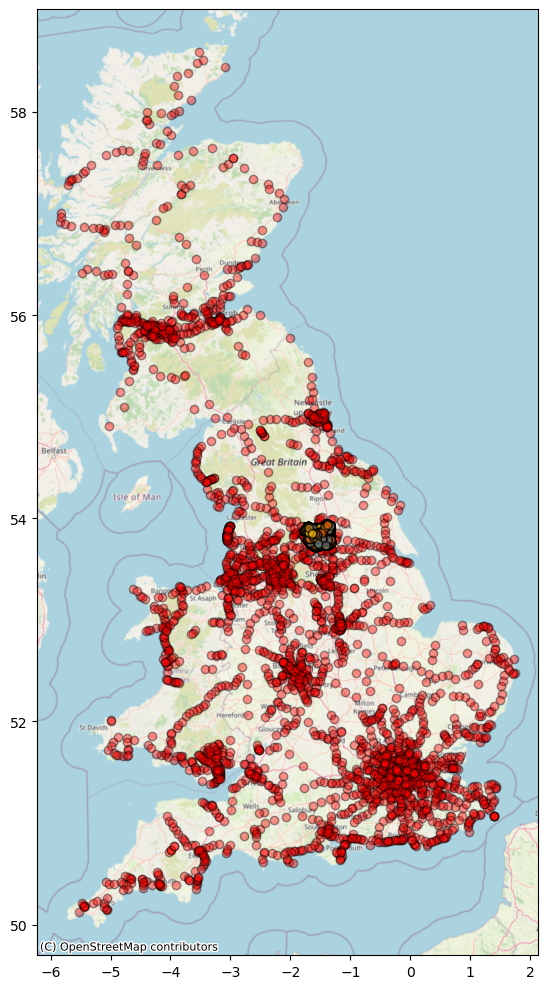

In [9]:
fig, ax = plt.subplots(figsize=(15, 10))

ax = rail_gdf.plot(ax = ax, alpha = 0.4, edgecolor = "k", color = "red")
prop_gdf.plot(ax = ax, alpha = 0.75, edgecolor = "k", column = "BUILT_FORM", cmap = "Dark2")
cx.add_basemap(ax=ax, crs=prop_gdf.crs, source=cx.providers.OpenStreetMap.Mapnik)

plt.tight_layout()
plt.show()

## Non-geospatial descriptive statistics exploration for Leeds property

/var/folders/tz/q11qj2t518z2mqsm9xzdw7r00000gn/T/ipykernel_2999/1786790939.py:23: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax[idx].set_xticklabels(ax[idx].get_xticklabels(), rotation=35, ha="right")
/var/folders/tz/q11qj2t518z2mqsm9xzdw7r00000gn/T/ipykernel_2999/1786790939.py:23: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax[idx].set_xticklabels(ax[idx].get_xticklabels(), rotation=35, ha="right")
/var/folders/tz/q11qj2t518z2mqsm9xzdw7r00000gn/T/ipykernel_2999/1786790939.py:23: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax[idx].set_xticklabels(ax[idx].get_xticklabels(), rotation=35, ha="right")
/var/folders/tz/q11qj2t518z2mqsm9xzdw7r00000gn/T/ipykernel_2999/1786790939.py:23: UserWarning: set_ticklabels() should only be used with

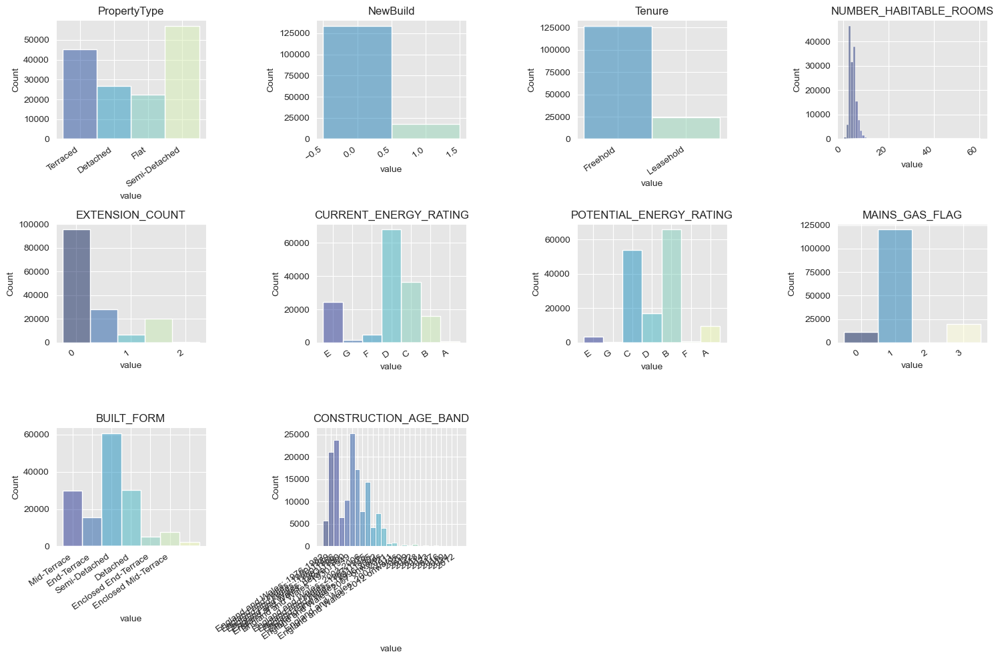

In [10]:
sns.set_style("darkgrid", {"axes.facecolor": ".9"})


prop_dfL = pd.melt(prop_df, id_vars = "LRUniqueID", value_vars = prop_df.columns.difference(["LRUniqueID", "Latitude", "Longitude"]))
prop_dfL["value"] = prop_dfL["value"].replace({True: 1, False: 0, None: 3})

cols_toplot = ["PropertyType", "NewBuild", "Tenure", "NUMBER_HABITABLE_ROOMS", 
               "EXTENSION_COUNT", "CURRENT_ENERGY_RATING", "POTENTIAL_ENERGY_RATING",
               "MAINS_GAS_FLAG", "BUILT_FORM", "CONSTRUCTION_AGE_BAND"]

#prop_dfL["value"] = prop_dfL["value"].fillna("Missing")

fig, ax = plt.subplots(3, 4, figsize = (15, 10))
ax = ax.ravel()

for idx, col in enumerate(cols_toplot):
    sns.histplot(prop_dfL[prop_dfL["variable"] == col], x = "value",
                 hue = "value", stat = "count", 
                 ax = ax[idx], legend = False,
                 discrete = True, palette = "YlGnBu_r")
    ax[idx].set_title(col)
    #ax[idx].tick_params(axis='x', rotation=35)
    ax[idx].set_xticklabels(ax[idx].get_xticklabels(), rotation=35, ha="right")
    #ax[idx].set_xlim(0,)

for idx in range(len(cols_toplot), len(ax)):
    fig.delaxes(ax[idx])

fig.tight_layout()
plt.savefig(f"{figure_path}/prop_variableHIST.png", format = "PNG")
plt.show()

In [11]:
# Add Different in ENERGY_EFFICIENTICY ENERGY_CONSUMPTIO
prop_df["EE_POTENTIAL_IMPROVEMENT"] = prop_df["POTENTIAL_ENERGY_EFFICIENCY"] - prop_df["CURRENT_ENERGY_EFFICIENCY"]
prop_df["EC_POTENTIAL_IMPROVEMENT"] = prop_df["ENERGY_CONSUMPTION_POTENTIAL"] - prop_df["ENERGY_CONSUMPTION_CURRENT"]

if ["EE_POTENTIAL_IMPROVEMNT", "EC_POTENTIAL_IMPROVEMENT"] not in cols_toplot:
    cols_toplot.extend(["TOTAL_FLOOR_AREA", "CURRENT_ENERGY_EFFICIENCY", "POTENTIAL_ENERGY_EFFICIENCY", 
                        "ENERGY_CONSUMPTION_CURRENT", "ENERGY_CONSUMPTION_POTENTIAL", "EE_POTENTIAL_IMPROVEMENT", 
                        "EC_POTENTIAL_IMPROVEMENT"])

prop_df[["EE_POTENTIAL_IMPROVEMENT", "EC_POTENTIAL_IMPROVEMENT"]]

,EE_POTENTIAL_IMPROVEMENT,EC_POTENTIAL_IMPROVEMENT
0,3,-22.0
1,0,0.0
2,26,-217.0
3,19,-157.0
4,7,-58.0
...,...,...
151280,8,-69.0
151281,1,-8.0
151282,14,-74.0
151283,8,-5.0


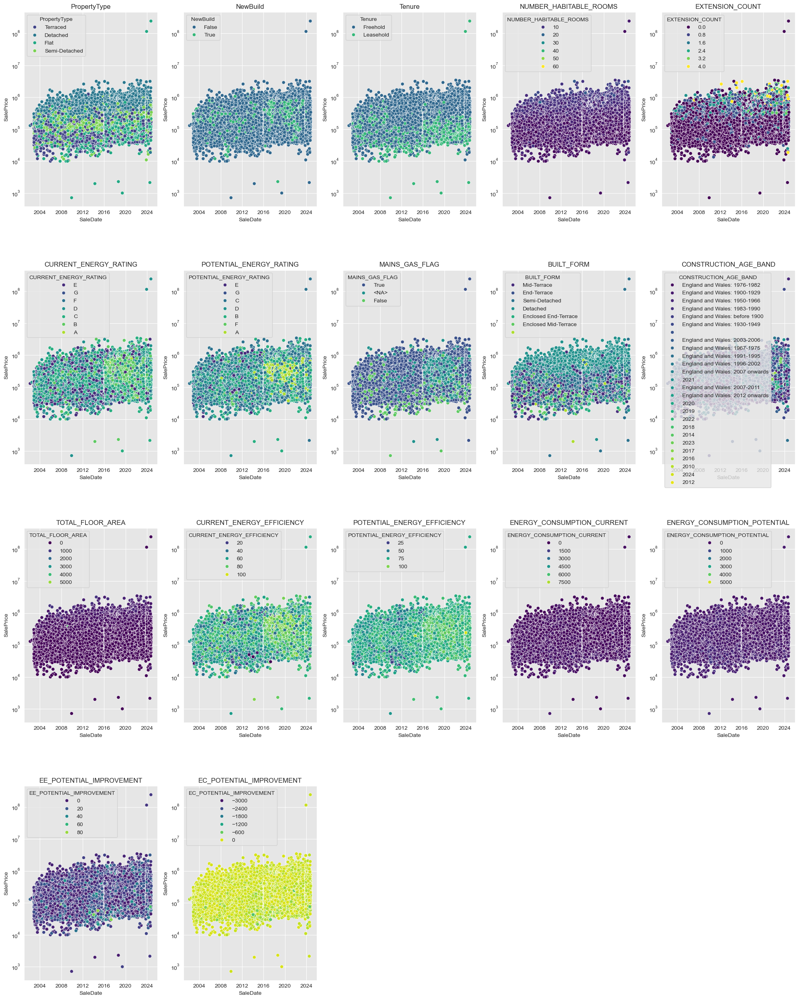

In [12]:
fig, ax = plt.subplots(4, 5, figsize = (20, 25))

ax = ax.ravel()

# Pyarrow does not read date well, change back to pd.datetime
prop_df["SaleDate"] = pd.to_datetime(prop_df["SaleDate"])

prop_df = prop_df.astype({
    "SalePrice": np.float64,
    #"SaleDate": np.datetime64,

    "NUMBER_HABITABLE_ROOMS": np.float64,
    "EXTENSION_COUNT": np.float64,
    "TOTAL_FLOOR_AREA": np.float64,
    "CURRENT_ENERGY_EFFICIENCY": np.float64,
    "POTENTIAL_ENERGY_EFFICIENCY": np.float64,
    "ENERGY_CONSUMPTION_CURRENT": np.float64,
    "ENERGY_CONSUMPTION_POTENTIAL": np.float64,
    "EE_POTENTIAL_IMPROVEMENT": np.float64,
    "EC_POTENTIAL_IMPROVEMENT": np.float64,

    "MAINS_GAS_FLAG": str,
})

for idx, col in enumerate(cols_toplot):
    sns.scatterplot(prop_df, x="SaleDate", y="SalePrice",
                    hue=col, ax=ax[idx], palette="viridis",
                    legend="brief")

    ax[idx].set_title(col)
    #ax[idx].set_xticklabels(ax[idx].get_xticklabels(), rotation=35, ha="right")
    #ax[idx].set_xlim(0,)
    ax[idx].set_yscale('log')

for idx in range(len(cols_toplot), len(ax)):
    fig.delaxes(ax[idx])

fig.tight_layout()
plt.savefig(f"{figure_path}/prop_variableSCATTER.png", format = "PNG")
plt.show()

In [13]:
# Change MAINS_GAS_FLAG back to boolean
prop_df["MAINS_GAS_FLAG"] = prop_df["MAINS_GAS_FLAG"].map({'True': True, 'False': False, '<NA>': None})

prop_df["MAINS_GAS_FLAG"].unique()

array([True, None, False], dtype=object)

### Correlation matrix for quantitative and boolean variables


In [14]:
# Omitting non quantitative data or non ordinal that can be One-Hot
OHprop_df = prop_df[["SalePrice", "NewBuild", "Tenure", "TOTAL_FLOOR_AREA", "NUMBER_HABITABLE_ROOMS", "EXTENSION_COUNT", "CURRENT_ENERGY_RATING",
                     "POTENTIAL_ENERGY_RATING", "ENERGY_CONSUMPTION_CURRENT", "ENERGY_CONSUMPTION_POTENTIAL", "MAINS_GAS_FLAG", "BUILT_FORM", 
                     "PropertyType"]]

OneHot_dict = {
    # ENERGY_RATING
    "A": 5,
    "B": 4,
    "C": 3,
    "D": 2,
    "E": 1,
    # Boolean
    True: 1,
    False: 0,
    None: None,
    # PropertyType
    "Detached": 4,
    "Semi-Detached": 3,
    "Terraced": 2,
    "Flat": 1,
    # Tenure
    "Freehold": 1,
    "Leasehold": 0
}

builtform_dict = {
    # BUILT_FORM to not overlap with PropertyType
    "Detached": 6,
    "Semi-Detached": 5,
    "Enclosed End-Terrace": 4,
    "End-Terrace": 3,
    "Enclosed Mid-Terrace": 2,
    "Mid-Terrace": 1,
}

OH_cols = ["CURRENT_ENERGY_RATING", "POTENTIAL_ENERGY_RATING", "BUILT_FORM", 
           "PropertyType", "Tenure", "MAINS_GAS_FLAG", "NewBuild"]

for col in OHprop_df[OH_cols]:
    if col == "BUILT_FORM":
        OHprop_df[col] = OHprop_df[col].map(builtform_dict)
    else:
        OHprop_df[col] = OHprop_df[col].map(OneHot_dict)

OHprop_df

/var/folders/tz/q11qj2t518z2mqsm9xzdw7r00000gn/T/ipykernel_2999/3012157906.py:44: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  OHprop_df[col] = OHprop_df[col].map(OneHot_dict)
/var/folders/tz/q11qj2t518z2mqsm9xzdw7r00000gn/T/ipykernel_2999/3012157906.py:44: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  OHprop_df[col] = OHprop_df[col].map(OneHot_dict)
/var/folders/tz/q11qj2t518z2mqsm9xzdw7r00000gn/T/ipykernel_2999/3012157906.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice fr

,SalePrice,NewBuild,Tenure,TOTAL_FLOOR_AREA,NUMBER_HABITABLE_ROOMS,EXTENSION_COUNT,CURRENT_ENERGY_RATING,POTENTIAL_ENERGY_RATING,ENERGY_CONSUMPTION_CURRENT,ENERGY_CONSUMPTION_POTENTIAL,MAINS_GAS_FLAG,BUILT_FORM,PropertyType
0,113500.0,0.0,1.0,55.440,4.0,0.0,1.0,1.0,389.0,367.0,1.0,1.0,2.0
1,280000.0,0.0,1.0,52.840,7.0,0.0,NaN,NaN,720.0,720.0,1.0,1.0,2.0
2,105000.0,0.0,1.0,89.240,4.0,0.0,NaN,1.0,547.0,330.0,1.0,3.0,2.0
3,135000.0,0.0,1.0,86.900,5.0,1.0,1.0,3.0,394.0,237.0,1.0,5.0,4.0
4,169000.0,0.0,0.0,155.934,8.0,1.0,NaN,1.0,425.0,367.0,1.0,3.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
151280,232500.0,0.0,1.0,115.700,5.0,0.0,NaN,1.0,457.0,388.0,1.0,3.0,3.0
151281,135000.0,0.0,1.0,66.080,4.0,0.0,2.0,2.0,217.0,209.0,1.0,1.0,2.0
151282,250000.0,0.0,1.0,115.410,6.0,1.0,2.0,3.0,275.0,201.0,1.0,6.0,4.0
151283,176000.0,1.0,0.0,48.840,3.0,0.0,3.0,4.0,212.0,207.0,0.0,3.0,1.0


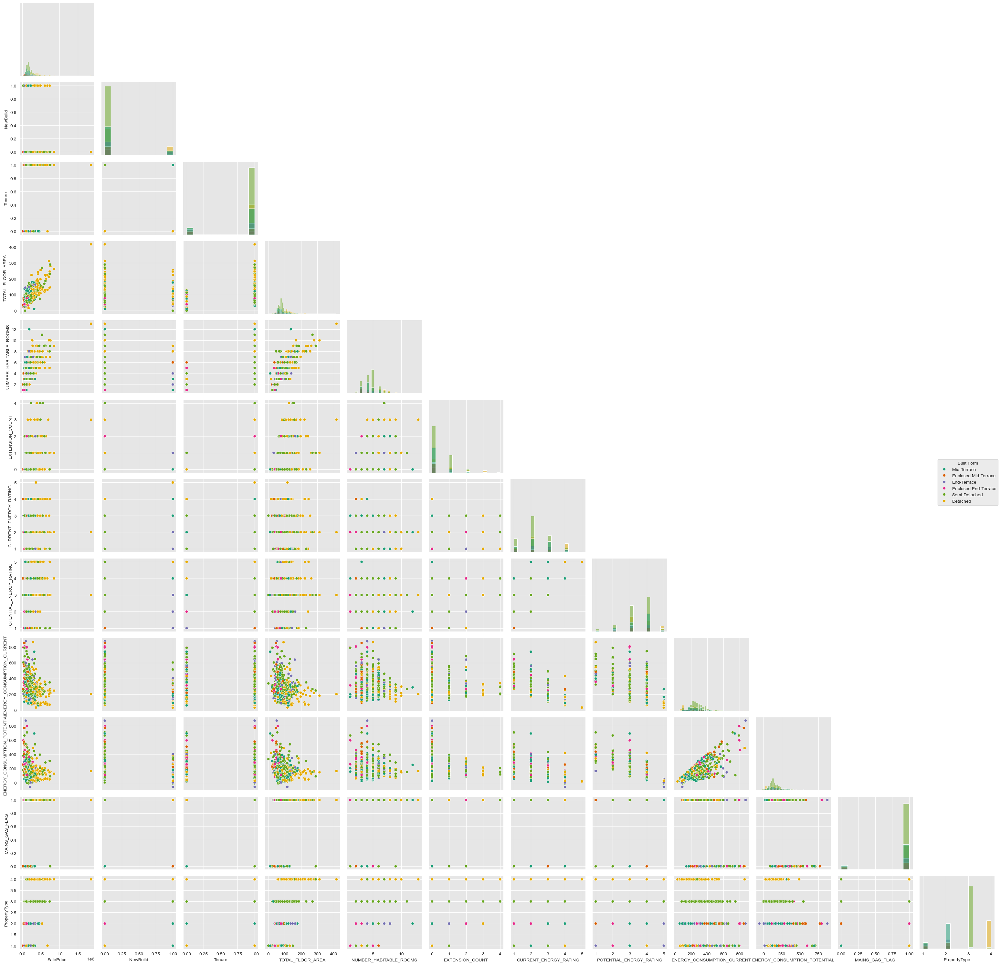

In [15]:
# Pairplot
sample_OHprop = OHprop_df.sample(n=1000, random_state=42)

OH_pairplot = sns.pairplot(sample_OHprop, hue = "BUILT_FORM",
                           diag_kind="hist", corner = True,
                           palette = "Dark2")

# Create mapping dictionary
label_map = {
    6: "Detached",
    5: "Semi-Detached",
    4: "Enclosed End-Terrace",
    3: "End-Terrace",
    2: "Enclosed Mid-Terrace",
    1: "Mid-Terrace"
}

# Get the legend handles and labels
handles = OH_pairplot._legend.legend_handles
old_labels = [float(t.get_text()) for t in OH_pairplot._legend.texts]
new_labels = [label_map[label] for label in old_labels]

# Remove old legend and create new one
OH_pairplot._legend.remove()
OH_pairplot.fig.legend(handles=handles, 
                      labels=new_labels,
                      title="Built Form",
                      loc="center right")

plt.tight_layout()
plt.show()

## Geospatial analysis for Leeds properties using osmnx
### Features to make
1. Euclidean distance to nearest station
2. Average aggreted distance = Aggregated euclidean distances to stations within 24.94 km radius / reachable station

### According to the Department of Transport Journey Time Statistics Dataset: JTS0926
https://assets.publishing.service.gov.uk/media/5bc44587ed915d0b01a1bccc/jts0921.ods
> The average minimum car journey time to nearest rail stations in Leeds is 31 minutes\
> If the average intercity speed limit is 30 m/h (48.28 km/h)\
> This means that I should consider stations within property radius of 24.94 km

The OSM derived polygon seens to be off with its latitude and longitude\
Obtaining data from UK GOV geospatial portal instead\
https://geoportal.statistics.gov.uk/datasets/445118cc2e3b495aa81afa3925bfb0d9_0/explore?location=53.748137%2C-1.549435%2C9.68

Writing geodataframe to 02_intermediate


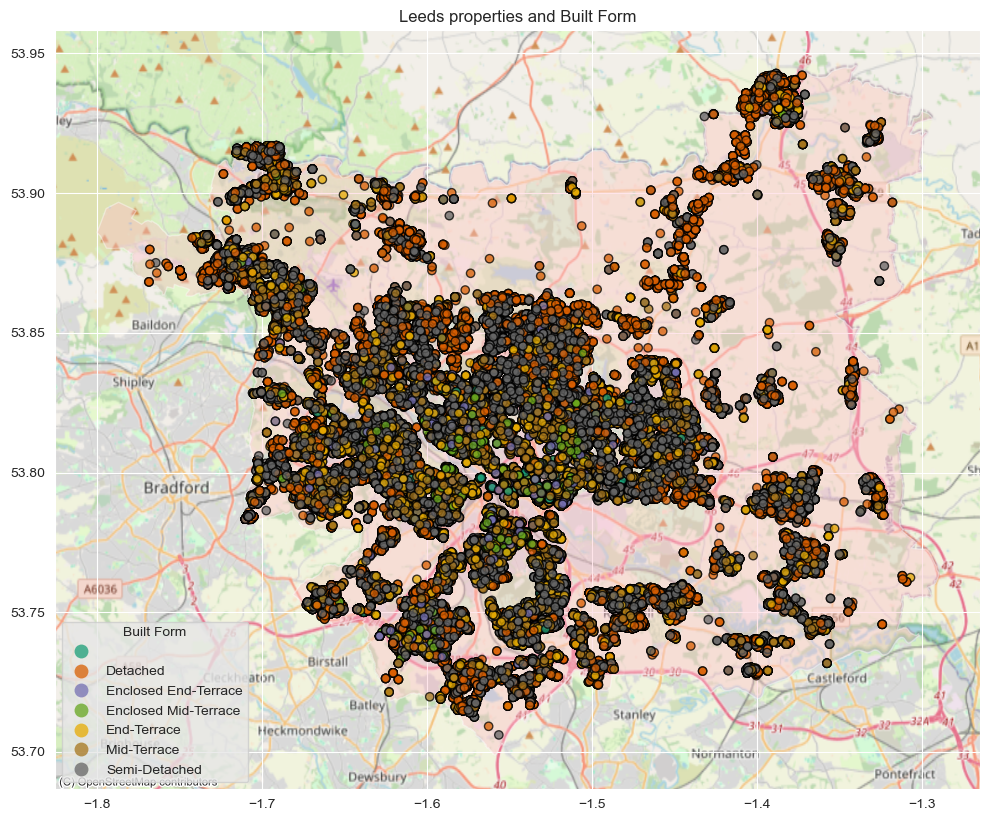

In [16]:
# Obtain Leeds city boundary polygon to clip properties
# Clip properties but not stations

# Clip leeds prop
if os.path.exists(f"{data_intermediate}/Leeds_propGDF.geojson"):
    print("Clipped Leeds properties geodataframe exist, reading from 02_intermediate")
    with open(f"{data_intermediate}/Leeds_propGDF.geojson", "r") as gdf:
        Leeds_propGDF = gpd.read_file(gdf)
    with open(f"{data_intermediate}/Leeds_polygon.geojson", "r") as gdf:
        Leeds_poly = gpd.read_file(gdf)
else:
    with open(f"{data_raw}/Counties_and_Unitary_Authorities_December_2023_Boundaries_UK_BFE_1835015529126193985.geojson", "r") as gdf:
        counties_gdf = gpd.read_file(gdf).to_crs(epsg=4326)
        Leeds_poly = counties_gdf[counties_gdf["CTYUA23NM"] == "Leeds"]
        with open(f"{data_intermediate}/Leeds_polygon.geojson", "w") as gdf:
            Leeds_poly.to_file(f"{data_intermediate}/Leeds_polygon.geojson", driver = "GeoJSON")

        with open(f"{data_intermediate}/Leeds_propGDF.geojson", "w") as gdf:
            print("Writing geodataframe to 02_intermediate")
            # Clipping
            assert prop_gdf.crs == Leeds_poly.crs, f"CRS misaligned, Property CRS: {prop_gdf.crs}, Leeds polygon CRS:{Leeds_poly.crs}"
            #Leeds_propGDF = gpd.clip(prop_gdf, Leeds_poly, keep_geom_type=True)
            Leeds_propGDF = gpd.sjoin(prop_gdf, Leeds_poly, predicate='intersects')
            Leeds_propGDF.to_file(f"{data_intermediate}/Leeds_propGDF.geojson", driver = "GeoJSON")


fig, ax = plt.subplots(figsize=(10, 15))

Leeds_map = Leeds_poly.plot(ax = ax, alpha=0.4, color = "pink")
Leeds_propGDF.plot(ax = ax, alpha = 0.75, edgecolor = "k", column = "BUILT_FORM", cmap = "Dark2", 
                   legend = True,
                   legend_kwds={
                      'title': 'Built Form',
                      'loc': 'lower left'
                  })
cx.add_basemap(ax = ax, crs = Leeds_propGDF.crs, source=cx.providers.OpenStreetMap.Mapnik)

plt.title("Leeds properties and Built Form")
plt.tight_layout()
plt.savefig(f"{figure_path}/Leeds_BFmap.png", format = "PNG")
plt.show()

### Example shortest path

In [17]:
def distance_calculator() -> 

SyntaxError: expected ':' (2129752628.py, line 1)